In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt

# Part 1 of 2


# Question 1, 2 & 3

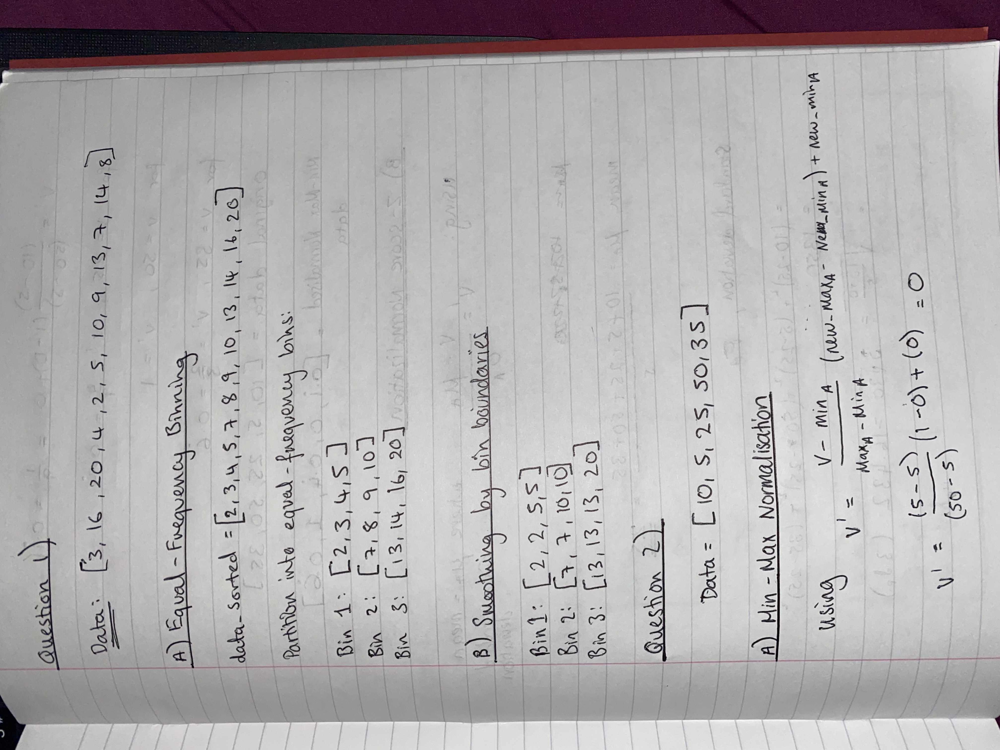

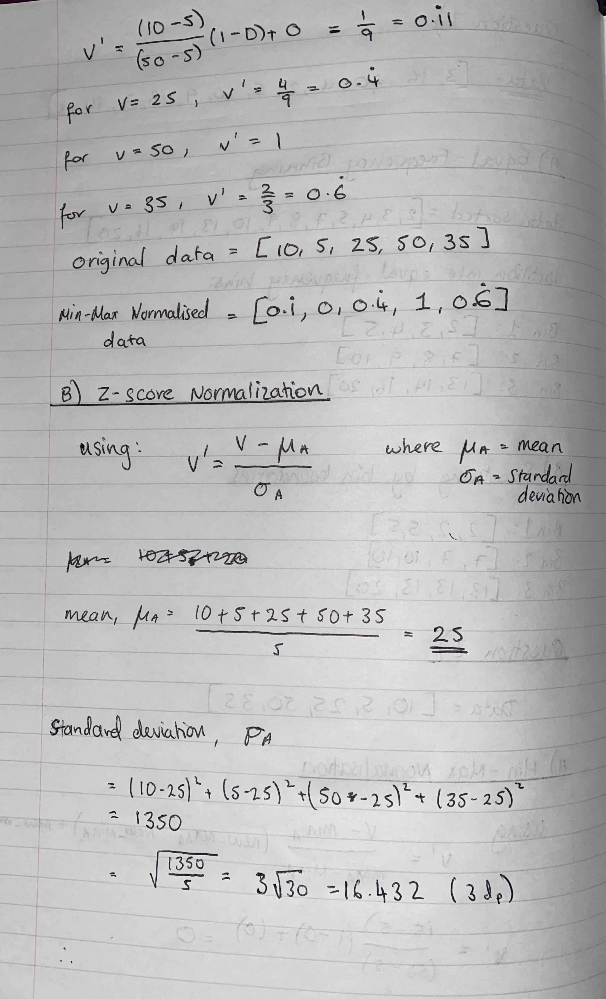

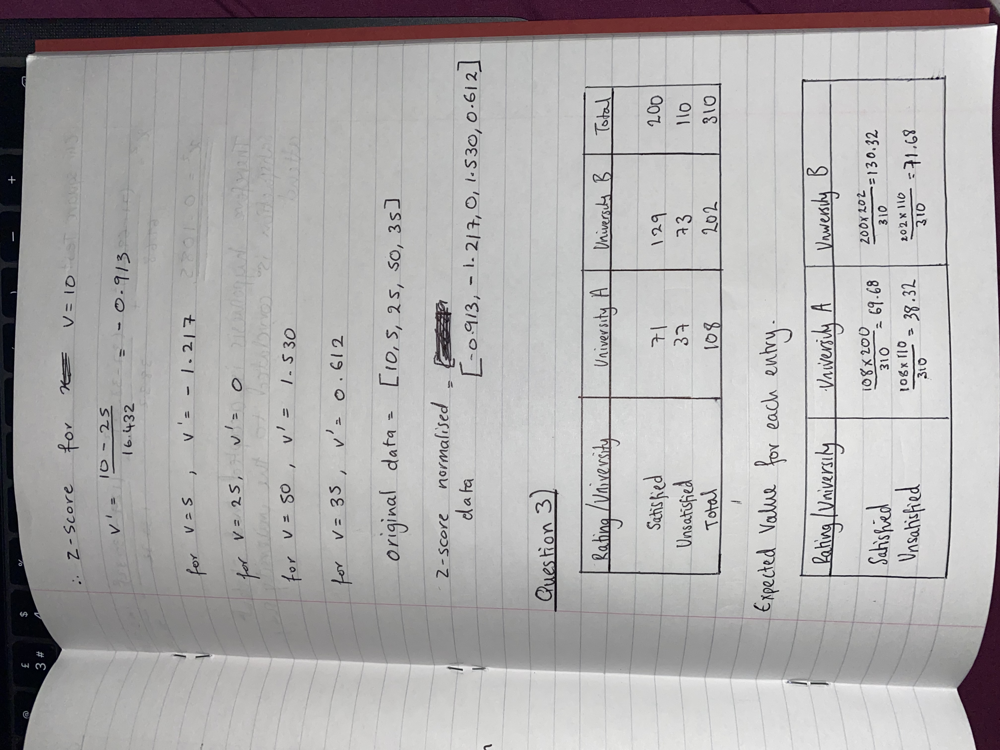

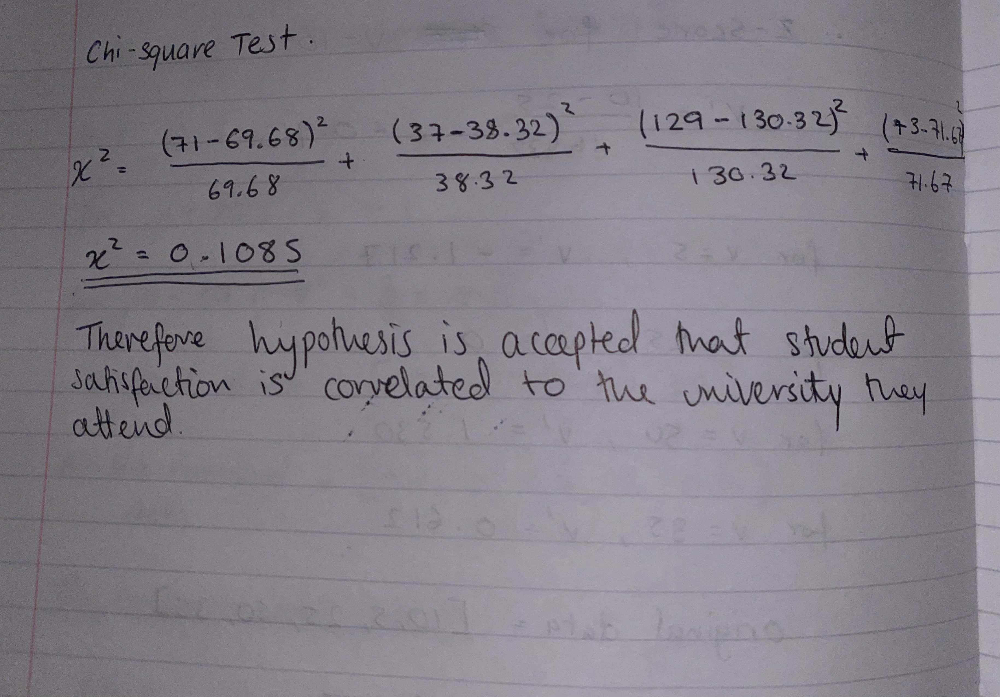

# Question 4

In [2]:
# read in the dataset
df = pd.read_csv('./Supplementary_Material_Week03_Lab-2/country-income.csv')
df

,Region,Age,Income,Online Shopper
0,India,49.0,86400.0,No
1,Brazil,32.0,57600.0,Yes
2,USA,35.0,64800.0,No
3,Brazil,43.0,73200.0,No
4,USA,45.0,NaN,Yes
5,India,40.0,69600.0,Yes
6,Brazil,NaN,62400.0,No
7,India,53.0,94800.0,Yes
8,USA,55.0,99600.0,No
9,India,42.0,80400.0,Yes


In [3]:
# show all the NaN values for each column
for col in df.columns:
    print('{0}: {1}'.format(col, df[col].isna().sum()))

Region: 0
Age: 1
Income: 1
Online Shopper: 0


In [4]:
# fill in all NaN values with the mean of that feature
df = df.fillna(df.mean())

# show the new updated dataset
df

,Region,Age,Income,Online Shopper
0,India,49.000000,86400.000000,No
1,Brazil,32.000000,57600.000000,Yes
2,USA,35.000000,64800.000000,No
3,Brazil,43.000000,73200.000000,No
4,USA,45.000000,76533.333333,Yes
5,India,40.000000,69600.000000,Yes
6,Brazil,43.777778,62400.000000,No
7,India,53.000000,94800.000000,Yes
8,USA,55.000000,99600.000000,No
9,India,42.000000,80400.000000,Yes


In [5]:
from sklearn.preprocessing import LabelEncoder
# Label encoder lets us return a numberical feature from a categorical one
le = LabelEncoder()
# Here we use label encoder for both the region and online shopper features
df['Region'] = le.fit_transform(df['Region'])
df['Online Shopper'] = le.fit_transform(df['Online Shopper'])
# Show our updated dataset
df

,Region,Age,Income,Online Shopper
0,1,49.000000,86400.000000,0
1,0,32.000000,57600.000000,1
2,2,35.000000,64800.000000,0
3,0,43.000000,73200.000000,0
4,2,45.000000,76533.333333,1
5,1,40.000000,69600.000000,1
6,0,43.777778,62400.000000,0
7,1,53.000000,94800.000000,1
8,2,55.000000,99600.000000,0
9,1,42.000000,80400.000000,1


# Question 5

In [6]:
# read in dataset and display
df = pd.read_csv('./Supplementary_Material_Week03_Lab-2/shoesize.csv')
df

,Index,Gender,Size,Height
0,1,F,5.5,60.0
1,2,F,6.0,60.0
2,3,F,7.0,60.0
3,4,F,8.0,60.0
4,5,F,8.0,60.0
...,...,...,...,...
403,404,M,13.0,78.0
404,405,M,13.0,78.0
405,406,M,14.0,78.0
406,407,M,15.0,80.0


In [7]:
# splits the data into male and female instances
female = df[df['Gender']=='F']
male = df[df['Gender']=='M']


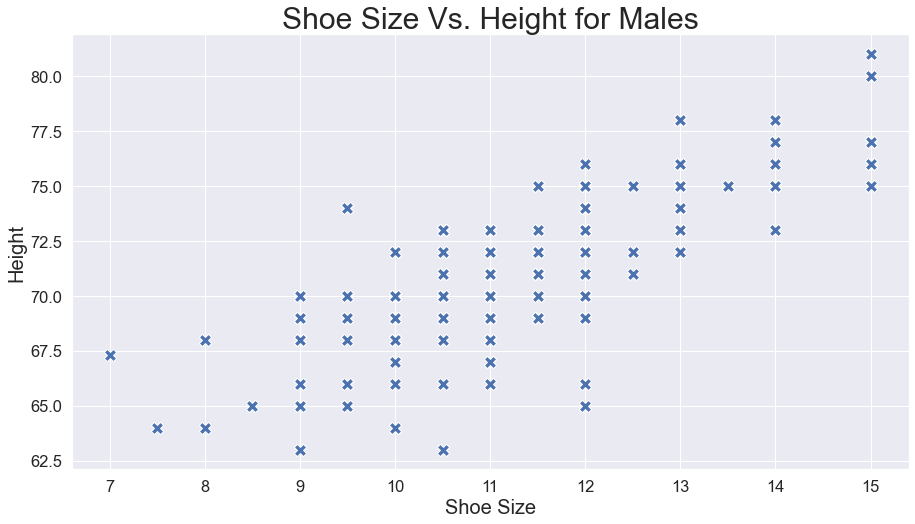

In [8]:
# Plot for male shoe size vs height
sns.set_style('darkgrid')
sns.set(rc = {'figure.figsize':(15,8)}, font_scale=1.5)
b = sns.scatterplot(x='Size', y='Height', data=male, color='b', marker='X', s=150)
b.set_title('Shoe Size Vs. Height for Males', fontsize=30)
b.set_xlabel('Shoe Size', fontsize=20)
b.set_ylabel('Height', fontsize=20)
plt.show()

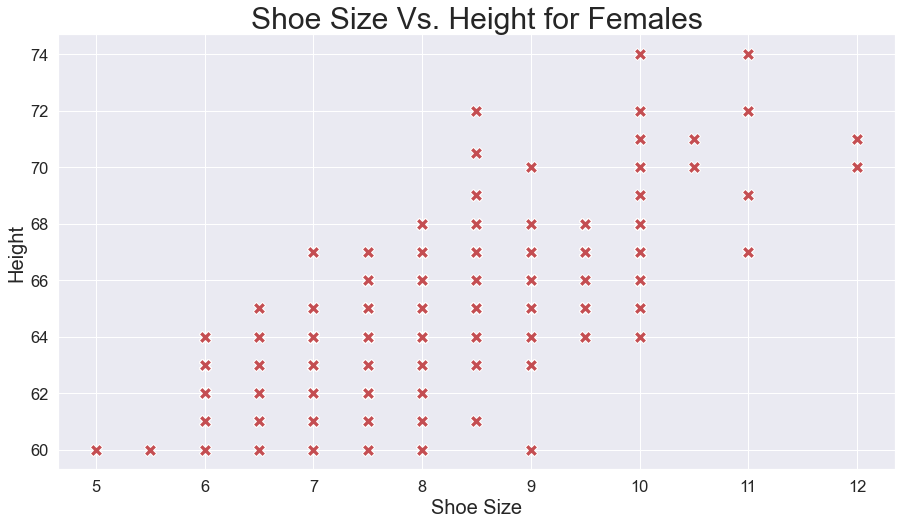

In [9]:
# Plot for male shoe size vs height
sns.set(rc = {'figure.figsize':(15,8)}, font_scale=1.5)
a = sns.scatterplot(x='Size', y='Height', data=female, color='r', marker='X', s=150)
a.set_title('Shoe Size Vs. Height for Females', fontsize=30)
a.set_xlabel('Shoe Size', fontsize=20)
a.set_ylabel('Height', fontsize=20)

plt.show()

In [10]:
# Calculating the Pearsons Coefficients for male and females using numpy
male_corr = np.corrcoef(x=male['Size'], y=male['Height'])
female_corr = np.corrcoef(x=female['Size'], y=female['Height'])

# Print the coefficients
print('Pearsons Coefficient for Males: {}'.format(male_corr[1,0]))
print('Pearsons Coefficient for Females: {}'.format(female_corr[1,0]))


Pearsons Coefficient for Males: 0.7677093547300976
Pearsons Coefficient for Females: 0.707811941714397


From the two graphs we can see that both males and females respectively have highly correlated variables 'Shoe Size' and 'Height' shown by the lowest correlation coefficient equating to 0.71 (2 dp) for females. Despite both sets of data being highly correlated, males show a stronger linear relationship with a coefficient of 0.78 (2 dp).

# Question 6

In [11]:
# Reading in dataset
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/breast-cancer-wisconsin.data', header=None)
# Naming the columns
df.columns = ['Sample code', 'Clump Thickness', 'Uniformity of Cell Size', 'Uniformity of Cell Shape',
                'Marginal Adhesion', 'Single Epithelial Cell Size', 'Bare Nuclei', 'Bland Chromatin',
                'Normal Nucleoli', 'Mitoses','Class']
df = df.replace('?',np.NaN)
# dropping the 'Sample code' column
df = df.drop(['Sample code'],axis=1)
# replacing all NaN values with the median value for each respective column
df = df.fillna(df.median())
# final dataset displayed
df


,Clump Thickness,Uniformity of Cell Size,Uniformity of Cell Shape,Marginal Adhesion,Single Epithelial Cell Size,Bare Nuclei,Bland Chromatin,Normal Nucleoli,Mitoses,Class
0,5,1,1,1,2,1,3,1,1,2
1,5,4,4,5,7,10,3,2,1,2
2,3,1,1,1,2,2,3,1,1,2
3,6,8,8,1,3,4,3,7,1,2
4,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...
694,3,1,1,1,3,2,1,1,1,2
695,2,1,1,1,2,1,1,1,1,2
696,5,10,10,3,7,3,8,10,2,4
697,4,8,6,4,3,4,10,6,1,4


In [12]:
# importing visulisation libraries
%matplotlib inline
import matplotlib.pyplot as plt
# importing preprocessing and principle component analysis libraries
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [13]:
# dataset of df with 'Class' feature removed
df1 = df.drop('Class',axis=1)
# Call PCA and choosing only 2 principle components
pca = PCA(n_components=2)
# Instantiate our scaler opertion
scaler = StandardScaler()
# scale and transform our dataset with all features included
scaled_df = scaler.fit_transform(df1)
# now data has been normalised, we can pass it into our PCA operation
# first fit the dataset
pca.fit(scaled_df)
# secondly transform the data
projected = pca.transform(scaled_df)
# putting our dataset with just two principle components back into a dataset
#.. to view what the values are
projected2 = pd.DataFrame(projected, columns=['pc1','pc2'])
projected2

,pc1,pc2
0,-1.456220,-0.110210
1,1.466279,-0.544894
2,-1.579311,-0.074854
3,1.505247,-0.558853
4,-1.330551,-0.089657
...,...,...
694,-1.711249,0.188019
695,-2.063036,0.234224
696,3.825359,-0.180466
697,2.269482,-1.113435


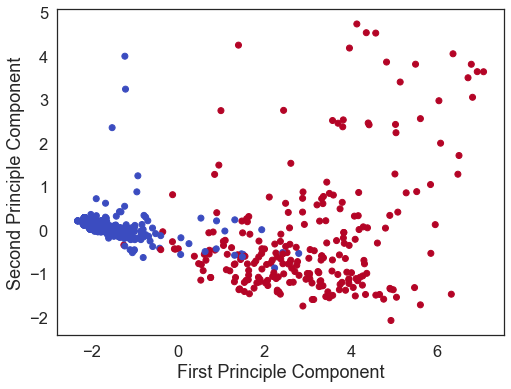

In [14]:
sns.set_style('white')
#figure.set_facecolor('white')
plt.figure(figsize=(8,6))
# Labelling both axes
plt.ylabel('Second Principle Component')
plt.xlabel('First Principle Component')
# compute the scatter plot
plt.scatter(projected[:,0], projected[:,1],c=df['Class'], cmap='coolwarm')
plt.show()

In [15]:
print('The explained variance ratio:')
print('\n')
print('Principle Component 1: {0}'.format(pca.explained_variance_ratio_[0], pca.explained_variance_ratio_[1]))
print('\n')
print('Principle Component 2: {0}'.format(pca.explained_variance_ratio_[1]))

The explained variance ratio:


Principle Component 1: 0.6544570379762193


Principle Component 2: 0.08608589755529698


Above is the PCA explained variance ratio for both components. The ratio returns us a number that indicates the percentage of variance each principle component attributes in our dataset, for our example, approximately 65% variance is attributed to component 1, whereas component 2 explains only 8%, therefore these two principle components explain 73% of the total variance in the dataset.

# Part 2 of 2

# Question 1

In [16]:
# read in dataset
df = pd.read_csv('graduation_rate.csv')
df

,ACT composite score,SAT total score,parental level of education,parental income,high school gpa,college gpa,years to graduate
0,30,2206,master's degree,94873,4.0,3.8,3
1,26,1953,some college,42767,3.6,2.7,9
2,28,2115,some high school,46316,4.0,3.3,5
3,33,2110,some high school,52370,4.0,3.5,4
4,30,2168,bachelor's degree,92665,4.0,3.6,4
...,...,...,...,...,...,...,...
995,30,1967,high school,49002,3.8,3.5,6
996,28,2066,some college,83438,3.9,3.5,4
997,27,1971,high school,68577,3.6,3.7,5
998,30,2057,some college,56876,3.8,3.6,3


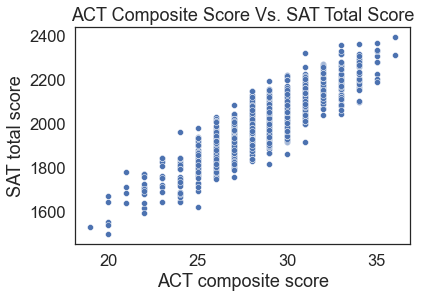

In [17]:
# creating a scatterplot for ACT score Vs. SAT score
sns.scatterplot(x='ACT composite score', y='SAT total score', data=df)
plt.title('ACT Composite Score Vs. SAT Total Score')
plt.show()

The graph above clearly shows a positive proportionality between an individuals SAT total score and their ACT composite score. Generally those who have a greater ACT composite score achieve higher marks on their SAT total scores.

# Question 2

Generally we see a relationship between the level of parental education and parental income displaying that the higher the level of education a parent recieves the more likely they are to earn a higher income. This is perfectly demonstrated when you look at the respective means (illustrated by the horizontal lines within the boxes) for each level of education. However, this doesn't mean that everyone who graduates with a masters degree will earn more than those who only achieved a bachelor's; for example the distribution of parental income for those with bachelor's degrees is far more spread out plus it can be seen that the third quartile is infact greater than the mean of the masters degree in addition to the maximum value much greater than the equivalent masters degree income.

In [18]:
# Creating a sub-dataset of those instances when the parent's studied a masters degree
masters = df[df['parental level of education'] == "master's degree"]
masters.reset_index()

,index,ACT composite score,SAT total score,parental level of education,parental income,high school gpa,college gpa,years to graduate
0,0,30,2206,master's degree,94873,4.0,3.8,3
1,27,28,2058,master's degree,96573,3.9,3.6,4
2,37,34,2363,master's degree,90775,4.0,3.6,4
3,65,32,2161,master's degree,75974,4.0,3.8,3
4,99,30,2223,master's degree,85135,4.0,3.8,3
...,...,...,...,...,...,...,...,...
63,912,31,2078,master's degree,83814,3.9,3.5,4
64,927,33,2330,master's degree,92185,4.0,3.8,4
65,929,35,2338,master's degree,79398,4.0,3.7,4
66,964,27,1999,master's degree,93314,3.7,3.3,5


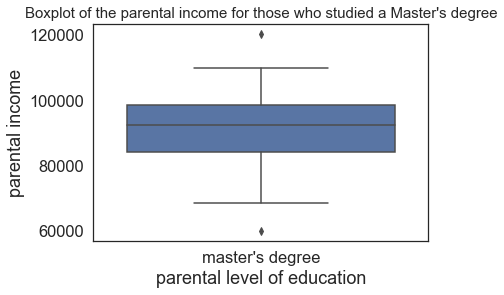

In [19]:
import seaborn as sns
sns.boxplot(x='parental level of education', y='parental income', data=masters)
plt.title("Boxplot of the parental income for those who studied a Master's degree", fontsize=15)
plt.show()

In [20]:
# Calculating the interquartile range using the 1st and 3rd quantiles.
Q1 = masters.quantile(0.25)
Q3 = masters.quantile(0.57)
IQR = Q3 - Q1
lower_bound = Q1 - (1.5*IQR)
upper_bound = Q3 + (1.5*IQR)

print(upper_bound,'\n', lower_bound)

# calculating the upper and lower bounds so we can then identify the boundary between a value
# an outlier value

ACT composite score        33.000
SAT total score          2277.225
parental income        109953.225
high school gpa             4.300
college gpa                 3.900
years to graduate           4.000
dtype: float64 
 ACT composite score       25.000
SAT total score         1847.665
parental income        68490.465
high school gpa            3.500
college gpa                3.100
years to graduate          4.000
dtype: float64


In [21]:
# Identifying the outliers in our dataset
upper_outliers = masters[masters['parental income'] > 109953.225]
lower_outliers = masters[masters['parental income'] < 68490.465]

In [22]:
lower_outliers

,ACT composite score,SAT total score,parental level of education,parental income,high school gpa,college gpa,years to graduate
420,28,2097,master's degree,59724,3.9,3.2,4
641,32,2274,master's degree,68319,4.0,3.6,4


In [23]:
upper_outliers

,ACT composite score,SAT total score,parental level of education,parental income,high school gpa,college gpa,years to graduate
411,31,2108,master's degree,120391,4.0,3.6,4


# Question 3

When computing distances, scaling/normalisating helps prevent features with a large range of values (e.g. property price £) out-weighing other features with smaller ranges (e.g. a binary attribute).

Data Mining: Concepts and Techniques, Jiawei Han, Micheline Kamber, 2011


# Question 4

Regarding the 1.9 Distance matrices section the heatmap produced illustrates the Euclidean distances between observations in a matrix form. In this particular example, darker shades of blue are indicative of large Euclidean distances, whereas white show less or no distance between observations. As you would expect across the diagonal no distances are show as they are in fact the same objects themselves. Despite not being the best representation of observations distances, it can still be clearly seen how some areas of the heatmap have darker regions where other regions have lighter ones. For instance the top right side of the heatmap show many instances of large distances hence the darker shades, the same can be said for the bottom left side. On the other hand, the bottom right of the heatmap clearly has lighter shades of blue indicating smaller Euclidean distances.

# Question 5

In [24]:
# Increasing the linspace to 100 evenly intervalled numbers between -1 and 1
x_range = np.linspace(-1, 1, 100)
y_range = np.linspace(-1, 1, 100)

# meshgrid: X[i, j] == x_range[j] and Y[i, j] == y_range[i]
X, Y = np.meshgrid(x_range, y_range)

# Z[i, j] == f(x_range[j], y_range[i])
Z = X**2 + Y**2

# Dataset representation
df = pd.DataFrame({'x': X.reshape(-1), 'y': Y.reshape(-1), 'z = f(x,y)': Z.reshape(-1)})
display(df)

,x,y,"z = f(x,y)"
0,-1.000000,-1.0,2.000000
1,-0.979798,-1.0,1.960004
2,-0.959596,-1.0,1.920824
3,-0.939394,-1.0,1.882461
4,-0.919192,-1.0,1.844914
...,...,...,...
9995,0.919192,1.0,1.844914
9996,0.939394,1.0,1.882461
9997,0.959596,1.0,1.920824
9998,0.979798,1.0,1.960004


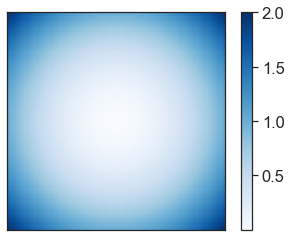

In [25]:
# Interpolation: point (x, y) is colored according to the value z of the nearest point in the dataset
plt.imshow(Z, cmap='Blues', aspect='equal', interpolation='nearest')
plt.colorbar()



# xticks and yticks would show Z matrix indices
plt.xticks([])
plt.yticks([])

plt.show()

The 'nearest' interpolation method will assign a pixel a value based on the values the neighboring pixels have, typically the RGB value is used. 
There is a significant distinction between the array with 10 evenly spaced intervals compared to the one with 100. The figure of the heatmap using 10 spaces displays a extremely rigid structure clearly showing each squares unique shade of blue, with the darkest shades in the corners and white centre. On the other hand, the 100 evenly spaced illustrated above shows a much smoother image; the darker shades remain in the corners however they are smaller in size and the white centre has almost been spread out more across the image showing a smoother, more gradual shift from light to dark shades.

# Question 6
## 6.1)

In [26]:
from sklearn.datasets import load_wine

In [27]:
# loading the dataset
data = load_wine()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = pd.Series(data.target)
df

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0,2
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0,2
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0,2
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0,2


In [28]:
# the frequency of each target feature 
df['target'].value_counts()

1    71
0    59
2    48
Name: target, dtype: int64

## 6.2)

In [29]:
# the univariant summary
df.drop('target', axis=1).describe()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [30]:
# Multivariant display
df.corr()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
alcohol,1.000000,0.094397,0.211545,-0.310235,0.270798,0.289101,0.236815,-0.155929,0.136698,0.546364,-0.071747,0.072343,0.643720,-0.328222
malic_acid,0.094397,1.000000,0.164045,0.288500,-0.054575,-0.335167,-0.411007,0.292977,-0.220746,0.248985,-0.561296,-0.368710,-0.192011,0.437776
ash,0.211545,0.164045,1.000000,0.443367,0.286587,0.128980,0.115077,0.186230,0.009652,0.258887,-0.074667,0.003911,0.223626,-0.049643
alcalinity_of_ash,-0.310235,0.288500,0.443367,1.000000,-0.083333,-0.321113,-0.351370,0.361922,-0.197327,0.018732,-0.273955,-0.276769,-0.440597,0.517859
magnesium,0.270798,-0.054575,0.286587,-0.083333,1.000000,0.214401,0.195784,-0.256294,0.236441,0.199950,0.055398,0.066004,0.393351,-0.209179
total_phenols,0.289101,-0.335167,0.128980,-0.321113,0.214401,1.000000,0.864564,-0.449935,0.612413,-0.055136,0.433681,0.699949,0.498115,-0.719163
flavanoids,0.236815,-0.411007,0.115077,-0.351370,0.195784,0.864564,1.000000,-0.537900,0.652692,-0.172379,0.543479,0.787194,0.494193,-0.847498
nonflavanoid_phenols,-0.155929,0.292977,0.186230,0.361922,-0.256294,-0.449935,-0.537900,1.000000,-0.365845,0.139057,-0.262640,-0.503270,-0.311385,0.489109
proanthocyanins,0.136698,-0.220746,0.009652,-0.197327,0.236441,0.612413,0.652692,-0.365845,1.000000,-0.025250,0.295544,0.519067,0.330417,-0.499130
color_intensity,0.546364,0.248985,0.258887,0.018732,0.199950,-0.055136,-0.172379,0.139057,-0.025250,1.000000,-0.521813,-0.428815,0.316100,0.265668


In [31]:
# grouping by target and calling the median method
df_grouped = df.groupby('target').median()
df_grouped

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
target,,,,,,,,,,,,,
0,13.750,1.770,2.44,16.8,104.0,2.800,2.980,0.29,1.870,5.40,1.070,3.17,1095.0
1,12.290,1.610,2.24,20.0,88.0,2.200,2.030,0.37,1.610,2.90,1.040,2.83,495.0
2,13.165,3.265,2.38,21.0,97.0,1.635,0.685,0.47,1.105,7.55,0.665,1.66,627.5


## 6.3)

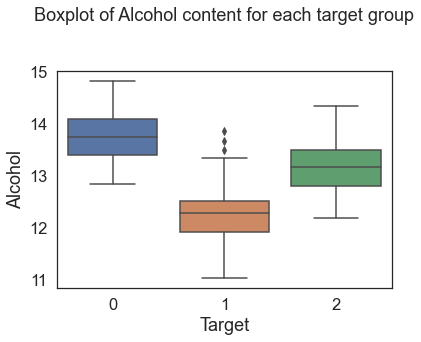

In [32]:
# creating a boxplot will group by the x-variable
sns.boxplot(x='target', y='alcohol', data=df)
plt.title('Boxplot of Alcohol content for each target group',pad=50)
plt.ylabel('Alcohol')
plt.xlabel('Target')
plt.show()

# 6.4)

In [33]:
# Inspecting correlations that are greater than 0.8
# you can see flavanoids and total_phenois are highly correlated
df.corr()>0.8

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
alcohol,True,False,False,False,False,False,False,False,False,False,False,False,False,False
malic_acid,False,True,False,False,False,False,False,False,False,False,False,False,False,False
ash,False,False,True,False,False,False,False,False,False,False,False,False,False,False
alcalinity_of_ash,False,False,False,True,False,False,False,False,False,False,False,False,False,False
magnesium,False,False,False,False,True,False,False,False,False,False,False,False,False,False
total_phenols,False,False,False,False,False,True,True,False,False,False,False,False,False,False
flavanoids,False,False,False,False,False,True,True,False,False,False,False,False,False,False
nonflavanoid_phenols,False,False,False,False,False,False,False,True,False,False,False,False,False,False
proanthocyanins,False,False,False,False,False,False,False,False,True,False,False,False,False,False
color_intensity,False,False,False,False,False,False,False,False,False,True,False,False,False,False


<AxesSubplot:xlabel='total_phenols', ylabel='flavanoids'>

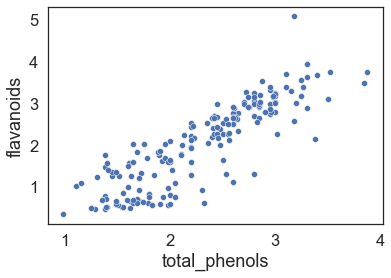

In [34]:
# Plotting the two most correlated features
sns.scatterplot(y='flavanoids', x='total_phenols', data=df)

# 6.5)

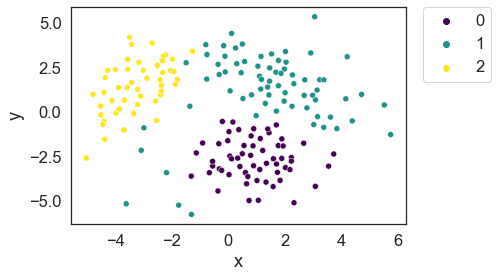

In [35]:
from sklearn.manifold import MDS
from sklearn.preprocessing import StandardScaler

# sorting daraset
df_sorted = df.sort_values(by='target', ascending=True)
target_sorted = df_sorted['target']

# scaling all the features
X = df_sorted.drop(columns='target').to_numpy()
scaler = StandardScaler()
X = scaler.fit_transform(X)

# reducing the number of dimensions
embedding = MDS(n_components=2)
Xp = embedding.fit_transform(X)

# places the now scaled dimensionally reduced data back into a dataframe
df_projection = pd.DataFrame({'x':Xp[:,0], 'y':Xp[:,1],
                             'target': target_sorted})


# producing the scatterplot and legend
sns.scatterplot(x='x', y='y', hue='target', data=df_projection, palette='viridis')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

